<a href="https://colab.research.google.com/github/jamesfloe/cap-comp215/blob/main/Run_Length_Encoded_GoL_Patterns.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [26]:
from matplotlib import rc
rc('animation', html='jshtml')
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from matplotlib import animation
from scipy.signal import convolve2d
import re
from scipy.signal import correlate2d
import pprint
import timeit

In [27]:
class Cell2DViewer():
    """Generates an animated view of an array image."""

    cmap = plt.get_cmap('Greens')
    options = dict(interpolation='nearest', alpha=0.8,
                   vmin=0, vmax=1, origin='upper')

    def __init__(self):
        self.im = None
        self.hlines = None
        self.vlines = None

    def step(self, iters=1):
        """Advances the viewee the given number of steps."""
        for i in range(iters):
            self.step()

    def draw(self, grid=False):
        """Draws the array and any other elements.
        grid: boolean, whether to draw grid lines
        """
        self.draw_array(self.array)
        if grid:
            self.draw_grid()

    def draw_array(self, array=None, cmap=None, **kwds):
        """Draws the cells."""
        if array is None:
            array = self.array
        a = array.copy()
        cmap = self.cmap if cmap is None else cmap

        n, m = a.shape
        plt.axis([0, m, 0, n])
        plt.xticks([])
        plt.yticks([])

        options = self.options.copy()
        options['extent'] = [0, m, 0, n]
        options.update(kwds)
        self.im = plt.imshow(a, cmap, **options)

    def draw_grid(self):
        """Draws the grid."""
        a = self.array
        n, m = a.shape
        lw = 2 if m < 7 else 1
        options = dict(color='white', linewidth=lw)

        shift = 0.005 * n
        rows = np.arange(n) + shift
        self.hlines = plt.hlines(rows, 0, m, **options)

        cols = np.arange(m)
        self.vlines = plt.vlines(cols, 0, n, **options)

    def animate(self, frames=20, interval=200, grid=False):
        """Creates an animation.
        frames: number of frames to draw
        interval: time between frames in ms
        """
        fig = plt.gcf()
        self.draw(grid)
        anim = animation.FuncAnimation(fig, self.animate_func,
                                       init_func=self.init_func,
                                       frames=frames, interval=interval)
        return anim

    def init_func(self):
        """Called at the beginning of an animation."""
        pass

    def animate_func(self, i):
        """Draws one frame of the animation."""
        if i > 0:
            self.step()
        a = self.array
        self.im.set_array(a)
        return (self.im,)

In [28]:
class Cell2D(Cell2DViewer):
    """Implements Conway's Game of Life."""

    def __init__(self, n, m=None):
        """Initializes the attributes.
        n: number of rows
        m: number of columns
        """
        m = n if m is None else m
        self.array = np.zeros((n, m), np.uint8)

    def add_cells(self, row, col, *strings):
        """Adds cells at the given location.
        row: top row index
        col: left col index
        strings: list of strings of 0s and 1s
        """
        for i, s in enumerate(strings):
            self.array[row+i, col:col+len(s)] = np.array([int(b) for b in s])
 
    def turn_rle_to_cells(self, rletuples, row, col):
      """Adds the actual RLE data to the life game
      rletuples: tuples from the load_pattern method to be processed.
      col: left col index
      row: top rown index
      """
      stringcounter = 0
      dictkey = 'string' + str(stringcounter)
      dictvalue = ''
      add_cell_stringsdict = {dictkey: dictvalue}
      
      row_pattern = row
      
      #Iterates over every tuple in rletuples
      for repeatingValue, operator in rletuples:
        if repeatingValue == '':
          repeatingValue = '1'

        #This loop arranges each alive and dead cell into a indexed string within the add_cell_stringsdict dictionary.
        #example: add_cell_stringsdict = {string0: '0011010', string1: '0101010', string2: '0111111'}
        for i in range(int(repeatingValue)):
          if operator == 'o':
            dictvalue += '1'
            indexedstring = {dictkey: dictvalue}
            add_cell_stringsdict.update(indexedstring)
          elif operator == 'b':
            dictvalue += '0'
            indexedstring = {dictkey: dictvalue}
            add_cell_stringsdict.update(indexedstring)
          elif operator == '$':
             
            #Because some tuples may have more than one repeating value before $, example (3,$)
            #This if statement must be added to add extra strings of all 0s into the dictionary.
            if int(repeatingValue) > 1:
              string0 = add_cell_stringsdict.get('string0')
              dictvalue = '0' * len(string0)
              stringcounter += 1
              dictkey = 'string' + str(stringcounter)
              indexedstring = {dictkey: dictvalue}
              add_cell_stringsdict.update(indexedstring)
              dictvalue = ''

            else:
              stringcounter += 1
              dictkey = 'string' + str(stringcounter)
              dictvalue = ''       

          elif operator == '!':
            break
      
      #This loop loads the strings in the dictionary, into the life object, by using add_cell_stringsdict.
      for i in range(stringcounter + 1):
        dictkey = 'string' + str(i)
        self.add_cells(row_pattern, col, add_cell_stringsdict[dictkey])
        row_pattern += 1

    def load_pattern(self, file_name, row, col): 
      """Adds the pattern from a .rle file to a give location.
      file_name: .rle file-name
      row: top row index
      col: left col index
      """
      starttime = timeit.default_timer()
      start_re_index = 0
      rlefile = open(file_name, 'r')
      rledata = (rlefile.readlines())
      rle_pairs = r'(\d+)?([bo$!])'
      tupledata = []

      #Finds which line to start processing the rle data
      for i, item in enumerate(rledata):
        if item[0].isalpha():
          start_re_index = i + 1
          break

      #Converts the rle string into tuples (# of times to repeat, dead cell or alive cell or new line or stop pattern)
      for item in rledata[start_re_index:]:
        tupledata = tupledata + re.findall(rle_pairs, item)

      self.turn_rle_to_cells(tupledata, row, col)
      print('load_pattern algorithm took', timeit.default_timer() - starttime)
    def step(self):
        """Executes one time step."""
        pass

In [29]:
class Life(Cell2D):
    """Implementation of Conway's Game of Life."""
    kernel = np.array([[1, 1, 1],
                       [1,10, 1],
                       [1, 1, 1]])

    table = np.zeros(20, dtype=np.uint8)
    table[[3, 12, 13]] = 1

    def step(self):
        """Executes one time step."""
        c = correlate2d(self.array, self.kernel, mode='same')
        self.array = self.table[c]

In [30]:
def make_life(n, m, row, col, *strings):
    """Makes a Life object.
    
    n, m: rows and columns of the Life array
    row, col: upper left coordinate of the cells to be added
    strings: list of strings of '0' and '1'
    """
    life = Life(n, m)
    life.add_cells(row, col, *strings)
    return life

load_pattern algorithm took 0.03760573199997452
load_pattern algorithm took 0.006941323999853921
load_pattern algorithm took 0.00045389600018097553


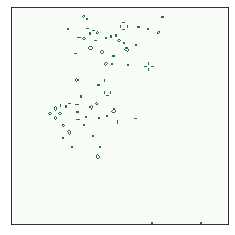

In [33]:
life = make_life(200, 200, 0, 0)
#life.load_pattern('/13-engine Cordership.txt', 40, 40)
life.load_pattern('/(13,1)c31 Pseudo-B climber.txt', 30, 30)
life.load_pattern('/$rats.txt', 70, 70)
life.animate(frames=4000,interval=1.0)


**Experimenting with Life patterns**

 The above animation demonstrates the load_pattern function.
The pattern $rats, which is static and oscillates, and the pattern c31 Pseudo-B climber, which involves a pattern that appears to "climb,"  have been loaded and placed at coordinates, so that they will eventually collide. 

This collision results in a seemingly random mess of spaceships patterns, still life patterns, and oscillator patterns.

"Blinkers," are the simplest oscillating pattern possible. An interesting observation, is that these blinkers tend to arrange themselves like a square, where a blinker is placed on each face of the square.

The still life patterns include, blocks, beehives, boats, ships, and tubs.

The spaceship patterns are the simplest and most common, "gliders."

Conclusion:
This collision of pre-loaded patterns results in a common oscillator, spaceship, and many still life patterns. Perhaps if the experiment was repeated with more intricate patterns colliding in more intricate ways, more complex patterns would appear throughout the time-steps.
An interesting conclusion to draw, is that such a simple algorithm can result in so many interesting and complex patterns. This is likely why Conway called it, his "game of life." It is easy to see, how these complex patterns can be compared to simple real life organisms. Maybe life is just an evolution of extremely simple rules, throughout many time-steps?




**Algorithm Analysis**

1. The algorithm for loading_patterns involves several loops, each loop computing many simple operations. For a large pattern, the Big-O anaylsis would appear as so, O(n^2). This is because there is a nested for loop, with simple operations nested within. 
For extremely large patterns such as high-number corderships, the load_pattern algorithm may take an extra few milliseconds. Thus, due to the simplicity of Conway's game of life, the load_pattern algorithm has almost no timing implications for long CA experiments.

2. The longest the load_pattern took, was 0.03760573199997452s. This was for the largest rle pattern I could find on the conway wikipedia.

3. Since the improvements are done on operations within loops, and on variables not in loops, the coeffecient and overhead of the algorithm are reduced.